Group Members: Haodong Hu, Hao Zheng, Shanglin Li, Kaihao Zhang

**Hao Zheng**

T1

In [1]:
from PIL import Image

In [2]:
class Steganography(object):

  @staticmethod
  def __int_to_bin(rgb):
    """Convert an integer tuple to a binary (string) tuple.
    :param rgb: An integer tuple (e.g. (220, 110, 96))
    :return: A string tuple (e.g. ("00101010", "11101011", "00010110"))
    """
    r, g, b = rgb
    return ('{0:08b}'.format(r),
        '{0:08b}'.format(g),
        '{0:08b}'.format(b))

  @staticmethod
  def __bin_to_int(rgb):
    """Convert a binary (string) tuple to an integer tuple.
    :param rgb: A string tuple (e.g. ("00101010", "11101011", "00010110"))
    :return: Return an int tuple (e.g. (220, 110, 96))
    """
    r, g, b = rgb
    return (int(r, 2),
        int(g, 2),
        int(b, 2))

  @staticmethod
  def __merge_rgb(rgb1, rgb2):
    """Merge two RGB tuples.
    :param rgb1: A string tuple (e.g. ("00101010", "11101011", "00010110"))
    :param rgb2: Another string tuple
    (e.g. ("00101010", "11101011", "00010110"))
    :return: An integer tuple with the two RGB values merged.
    """
    r1, g1, b1 = rgb1
    r2, g2, b2 = rgb2
    rgb = (r1[:4] + r2[:4],
        g1[:4] + g2[:4],
        b1[:4] + b2[:4])
    return rgb

  @staticmethod
  def merge(img1, img2):
    """Merge two images. The second one will be merged into the first one.
    :param img1: First image
    :param img2: Second image
    :return: A new merged image.
    """

    # Check the images dimensions
    if img2.size[0] > img1.size[0] or img2.size[1] > img1.size[1]:
      raise ValueError('Image 2 should not be larger than Image 1!')

    # Get the pixel map of the two images
    pixel_map1 = img1.load()
    pixel_map2 = img2.load()

    # Create a new image that will be outputted
    new_image = Image.new(img1.mode, img1.size)
    pixels_new = new_image.load()

    for i in range(img1.size[0]):
      for j in range(img1.size[1]):
        rgb1 = Steganography.__int_to_bin(pixel_map1[i, j])

        # Use a black pixel as default
        rgb2 = Steganography.__int_to_bin((0, 0, 0))

        # Check if the pixel map position is valid for the second image
        if i < img2.size[0] and j < img2.size[1]:
          rgb2 = Steganography.__int_to_bin(pixel_map2[i, j])

        # Merge the two pixels and convert it to a integer tuple
        rgb = Steganography.__merge_rgb(rgb1, rgb2)

        pixels_new[i, j] = Steganography.__bin_to_int(rgb)

    return new_image

  @staticmethod
  def unmerge(img):
    """Unmerge an image.
    :param img: The input image.
    :return: The unmerged/extracted image.
    """

    # Load the pixel map
    pixel_map = img.load()

    # Create the new image and load the pixel map
    new_image = Image.new(img.mode, img.size)
    pixels_new = new_image.load()

    # Tuple used to store the image original size
    original_size = img.size

    for i in range(img.size[0]):
      for j in range(img.size[1]):
        # Get the RGB (as a string tuple) from the current pixel
        r, g, b = Steganography.__int_to_bin(pixel_map[i, j])

        # Extract the last 4 bits (corresponding to the hidden image)
        # Concatenate 4 zero bits because we are working with 8 bit
        rgb = (r[4:] + '0000',
            g[4:] + '0000',
            b[4:] + '0000')

        # Convert it to an integer tuple
        pixels_new[i, j] = Steganography.__bin_to_int(rgb)

        # If this is a 'valid' position, store it
        # as the last valid position
        if pixels_new[i, j] != (0, 0, 0):
          original_size = (i + 1, j + 1)

    # Crop the image based on the 'valid' pixels
    new_image = new_image.crop((0, 0, original_size[0], original_size[1]))

    return new_image

In [3]:
def merge(img1, img2, output):
  merged_image = Steganography.merge(Image.open(img1), Image.open(img2))
  merged_image.save(output)

def unmerge(img, output):
  unmerged_image = Steganography.unmerge(Image.open(img))
  unmerged_image.save(output)


# **T2**


In [4]:
#from google.colab import drive
#drive.mount('/content/gdrive')
#!unzip gdrive/MyDrive/data.zip

Mounted at /content/gdrive
Archive:  gdrive/MyDrive/data.zip
   creating: data/
   creating: data/coast/
  inflating: data/coast/arnat59.jpg  
  inflating: data/coast/art1130.jpg  
  inflating: data/coast/art294.jpg   
  inflating: data/coast/art487.jpg   
  inflating: data/coast/bea1.jpg     
  inflating: data/coast/bea10.jpg    
  inflating: data/coast/bea14.jpg    
  inflating: data/coast/bea2.jpg     
  inflating: data/coast/bea20.jpg    
  inflating: data/coast/bea24.jpg    
  inflating: data/coast/bea26.jpg    
  inflating: data/coast/bea27.jpg    
  inflating: data/coast/bea29.jpg    
  inflating: data/coast/bea3.jpg     
  inflating: data/coast/bea30.jpg    
  inflating: data/coast/bea33.jpg    
  inflating: data/coast/bea38.jpg    
  inflating: data/coast/bea39.jpg    
  inflating: data/coast/bea4.jpg     
  inflating: data/coast/bea5.jpg     
  inflating: data/coast/bea9.jpg     
  inflating: data/coast/cdmc1000.jpg  
  inflating: data/coast/cdmc123.jpg  
  inflating: data/co

In [ ]:
#!unzip gdrive/MyDrive/modelsEpoch N110.zip

unzip:  cannot find or open gdrive/MyDrive/modelsEpoch, gdrive/MyDrive/modelsEpoch.zip or gdrive/MyDrive/modelsEpoch.ZIP.


In [5]:
import io
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import IPython
from scipy import fftpack
from itertools import islice
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.autograd import Variable
from torch import utils
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import pickle
from torchvision import datasets, utils
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from torchvision.transforms import ToPILImage
from random import shuffle

In [20]:
# Hyper Parameters
num_epochs = 110
batch_size = 64
learning_rate = 0.001
beta = 1

data_path = "/content/data"

# Mean and std deviation of imagenet dataset. Source: http://cs231n.stanford.edu/reports/2017/pdfs/101.pdf
std = [0.229, 0.224, 0.225]
mean = [0.485, 0.456, 0.406]

checkpoints_path = "/content/modelsEpoch N110.pkl"
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
if not os.path.exists(checkpoints_path): os.mkdir(checkpoints_path)

In [7]:
def customized_loss(S_prime, C_prime, S, C, B):
  ''' Calculates loss specified on the paper.'''
  
  loss_cover = torch.nn.functional.mse_loss(C_prime, C)
  loss_secret = torch.nn.functional.mse_loss(S_prime, S)
  loss_all = loss_cover + B * loss_secret
  return loss_all, loss_cover, loss_secret

def gaussian(tensor, mean=0, stddev=0.1):
    '''Adds random noise to a tensor.'''
    
    # noise = torch.nn.init.normal(torch.Tensor(tensor.size()), 0, 0.1)
    noise = torch.nn.init.normal_(torch.Tensor(tensor.size()), 0, 0.1).cuda()
    return (tensor + noise).clone().detach().requires_grad_(True)
  
def get_2D_dct(img):
    """ Get 2D Cosine Transform of Image
    """
    return fftpack.dct(fftpack.dct(img.T, norm='ortho').T, norm='ortho')

In [8]:
class PrepNet(nn.Module):
    def __init__(self):
        super(PrepNet, self).__init__()
        
        # Preparation Network
        self.p1 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU()
        )
        
        self.p2 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU()
        )

        self.p3 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )

        self.p4 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU()
        )
        
        self.p5 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU()
        )

        self.p6 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )

    def forward(self, S):
        
        p1 = self.p1(S)
        p2 = self.p2(S)
        p3 = self.p3(S)
        x = torch.cat((p1, p2, p3), 1)
        p4 = self.p4(x)
        p5 = self.p5(x)
        p6 = self.p6(x)
        y = torch.cat((p4, p5, p6), 1)
        return y

In [9]:
class EncoderNet(nn.Module):

    def __init__(self):
        super(EncoderNet, self).__init__()
        self.e1 = nn.Sequential(
            nn.Conv2d(153, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
        )

        self.e2 = nn.Sequential(
            nn.Conv2d(153, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU(),
        )

        self.e3 = nn.Sequential(
            nn.Conv2d(153, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
        )

        self.e4 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )

        self.e5 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )

        self.e6 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )

        self.out = nn.Sequential(
            nn.Conv2d(150, 3, kernel_size=1, padding=0)
        )

    def forward(self, x):
        e1 = self.e1(x)
        e2 = self.e2(x)
        e3 = self.e3(x)
        x = torch.cat((e1, e2, e3), 1)
        e4 = self.e4(x)
        e5 = self.e5(x)
        e6 = self.e6(x)
        x = torch.cat((e4, e5, e6), 1)
        y = self.out(x)
        y_noise = gaussian(y.data, 0, 0.1)
        return y, y_noise

In [10]:
class DecoderNet(nn.Module):
    def __init__(self):
        super(DecoderNet, self).__init__()

        self.d1 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU()
        )
        
        self.d2 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU()
        )

        self.d3 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )

        self.d4 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU()
        )
        
        self.d5 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU()
        )

        self.d6 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU()
        )
        self.final = nn.Sequential(
            nn.Conv2d(150, 3, kernel_size=1, padding=0)
        )
    
    def forward(self, x):
        d1 = self.d1(x)
        d2 = self.d2(x)
        d3 = self.d3(x)
        x = torch.cat((d1, d2, d3), 1)
        d4 = self.d4(x)
        d5 = self.d5(x)
        d6 = self.d6(x)
        x = torch.cat((d4, d5, d6), 1)
        y = self.final(x)
        return y

In [11]:
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.p = PrepNet()
        self.e = EncoderNet()
        self.d = DecoderNet()

    def forward(self, S, C):
        # secret = S.cpu()
        # secret = secret.detach().numpy()
        # for k in secret:
        #     k=fftpack.dct(k.T, norm='ortho')
        # S = torch.Tensor(secret).cuda()
        S = self.p(S)
        x = torch.cat((S, C), 1)
        x, x_noise = self.e(x)
        y = self.d(x_noise)
        return x, y

In [12]:
model = Model().cuda()

In [13]:
def load_data(data_path):
    data_list = []
    for root, dirs, files in os.walk(data_path):
        for file in files:
            if file.endswith(".jpg"):
                data_list.append(os.path.join(root, file))
    return data_list

In [14]:
data_list = load_data(data_path)
shuffle(data_list)
data_list = np.array(data_list)
train_data = data_list[0:int(0.8*len(data_list))]
test_data = data_list[int(0.8*len(data_list)):]

In [15]:
train_transforms = transforms.Compose([
        transforms.Resize(128),
        transforms.RandomCrop(128),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
        std=std)
        ])

test_transforms = transforms.Compose([
        transforms.Resize(128),
        transforms.RandomCrop(128),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
        std=std)
        ])

In [16]:
class MyDataset(Dataset):

    def __init__(self, imgs, transform=None):
        super(MyDataset, self).__init__()   
        self.imgs = imgs
        self.transform = transform

    def __getitem__(self, index):
        img_path = self.imgs[index]
        img = Image.open(img_path)
        if self.transform is not None:
            data = self.transform(img)
        else:
            img = np.asarray(img)
            data = torch.from_numpy(img)
        return data
    
    def __len__(self):
        return len(self.imgs)

In [17]:
train_dataset = MyDataset(train_data, train_transforms)
test_dataset = MyDataset(test_data, test_transforms)
#Creates training set
train_loader = torch.utils.data.DataLoader(
        train_dataset, batch_size=batch_size, num_workers=0, 
        pin_memory=True, shuffle=True, drop_last=True)

# Creates test set
test_loader = torch.utils.data.DataLoader(
        test_dataset, batch_size=2, num_workers=0, 
        pin_memory=True, shuffle=False, drop_last=True)

In [18]:

def train_model(train_loader, beta, learning_rate):
    
    # Save optimizer
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    loss_history = []
    # Iterate over batches performing forward and backward passes
    for epoch in range(num_epochs):

        # Train mode
        model.train()
        
        train_losses = []
        # Train one epoch
        for idx, train_batch in enumerate(train_loader):

            data = train_batch
            data = data.cuda()

            # Saves secret images and secret covers
            train_covers = data[:len(data)//2]
            train_secrets = data[len(data)//2:]
            
            # Creates variable from secret and cover images
            train_secrets = train_secrets.clone().detach().requires_grad_(True)
            train_covers = train_covers.clone().detach().requires_grad_(True)

            # Forward + Backward + Optimize
            optimizer.zero_grad()
            train_hidden, train_output = model(train_secrets, train_covers)

            # Calculate loss and perform backprop
            train_loss, train_loss_cover, train_loss_secret = customized_loss(train_output, train_hidden, train_secrets, train_covers, beta)
            train_loss.backward()
            optimizer.step()
            
            # Saves training loss
            # print(train_loss.data)
            train_losses.append(torch.Tensor.item(train_loss.data))
            loss_history.append(torch.Tensor.item(train_loss.data))
            
            # Prints mini-batch losses
            print('Training: Batch {0}/{1}. Loss of {2:.4f}, cover loss of {3:.4f}, secret loss of {4:.4f}'.format(idx+1, len(train_loader), (torch.Tensor.item(train_loss.data)), torch.Tensor.item(train_loss_cover.data), torch.Tensor.item(train_loss_secret.data)))
        
        if epoch+1 % 10 == 0:
            torch.save(model.state_dict(), checkpoints_path+'Epoch N{}.pkl'.format(epoch+1))
        
        mean_train_loss = np.mean(train_losses)
    
        # Prints epoch average loss
        print ('Epoch [{0}/{1}], Average_loss: {2:.4f}'.format(
                epoch+1, num_epochs, mean_train_loss))
    
    return model, mean_train_loss, loss_history

In [ ]:
#Used for trainning modle!!! Do not run it again(Colab has limited trains)
#model, mean_train_loss, loss_history = train_model(train_loader, beta, learning_rate)


In [21]:
model.load_state_dict(torch.load('/content/modelsEpoch N110.pkl'))

<All keys matched successfully>

In [22]:
def denormalize(image, std, mean):
    ''' Denormalizes a tensor of images.'''

    for t in range(3):
        image[t, :, :] = (image[t, :, :] * std[t]) + mean[t]
    return image
    
def imshow(img, idx, learning_rate, beta):
    '''Prints out an image given in tensor format.'''
    
    img = denormalize(img, std, mean)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title('Example '+str(idx)+', lr='+str(learning_rate)+', B='+str(beta))
    plt.show()
    return

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.53 
Loss on secret: 0.53 
Loss on cover: 0.00


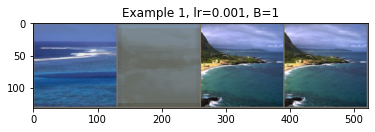

Total loss: 1.16 
Loss on secret: 1.16 
Loss on cover: 0.00


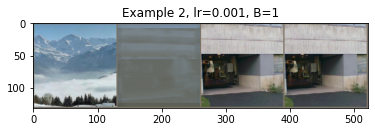

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.45 
Loss on secret: 1.45 
Loss on cover: 0.00


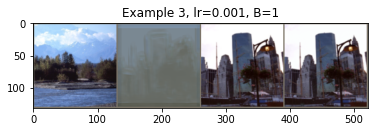

Total loss: 0.67 
Loss on secret: 0.67 
Loss on cover: 0.00


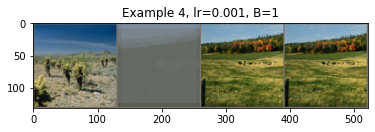

Total loss: 1.04 
Loss on secret: 1.04 
Loss on cover: 0.00


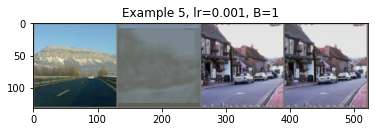

Total loss: 2.92 
Loss on secret: 2.92 
Loss on cover: 0.00


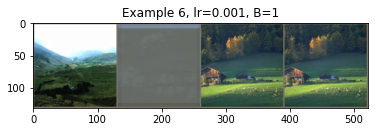

Total loss: 0.86 
Loss on secret: 0.86 
Loss on cover: 0.00


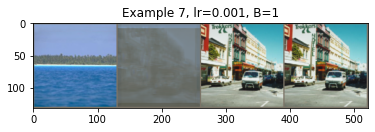

Total loss: 1.40 
Loss on secret: 1.40 
Loss on cover: 0.00


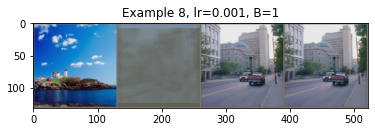

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.94 
Loss on secret: 0.93 
Loss on cover: 0.00


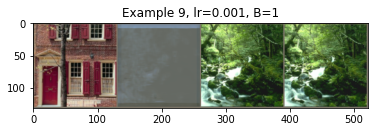

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 3.16 
Loss on secret: 3.16 
Loss on cover: 0.00


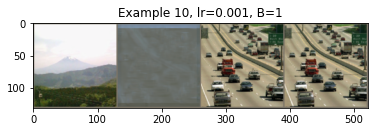

Total loss: 1.67 
Loss on secret: 1.67 
Loss on cover: 0.00


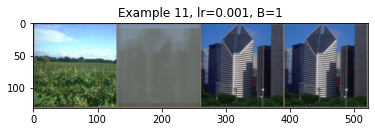

Total loss: 2.36 
Loss on secret: 2.36 
Loss on cover: 0.00


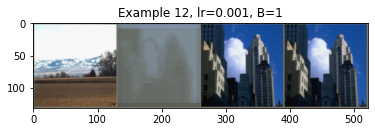

Total loss: 1.14 
Loss on secret: 1.14 
Loss on cover: 0.00


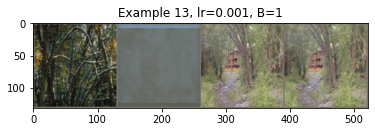

Total loss: 1.69 
Loss on secret: 1.69 
Loss on cover: 0.00


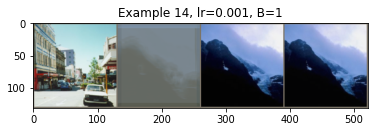

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.84 
Loss on secret: 0.84 
Loss on cover: 0.00


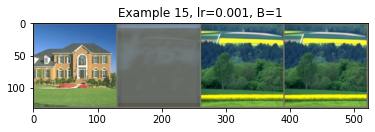

Total loss: 0.61 
Loss on secret: 0.61 
Loss on cover: 0.00


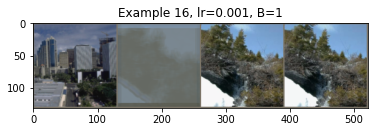

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.18 
Loss on secret: 2.18 
Loss on cover: 0.00


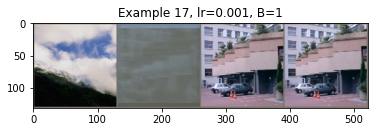

Total loss: 0.46 
Loss on secret: 0.46 
Loss on cover: 0.00


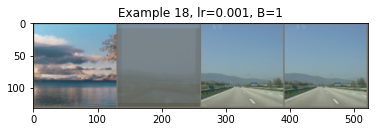

Total loss: 0.27 
Loss on secret: 0.27 
Loss on cover: 0.00


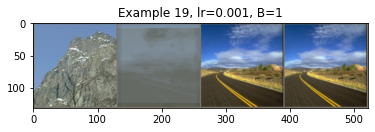

Total loss: 0.20 
Loss on secret: 0.20 
Loss on cover: 0.00


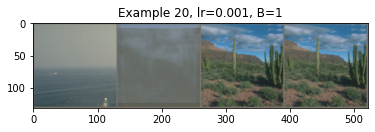

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.43 
Loss on secret: 1.43 
Loss on cover: 0.00


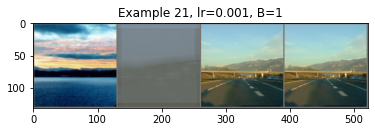

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.74 
Loss on secret: 0.74 
Loss on cover: 0.00


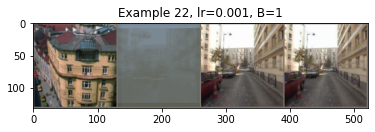

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.51 
Loss on secret: 1.51 
Loss on cover: 0.00


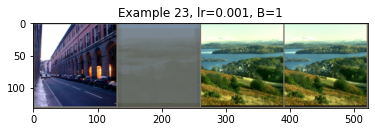

Total loss: 1.04 
Loss on secret: 1.04 
Loss on cover: 0.00


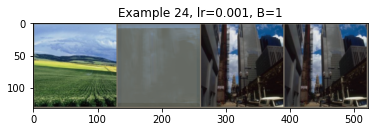

Total loss: 1.31 
Loss on secret: 1.31 
Loss on cover: 0.00


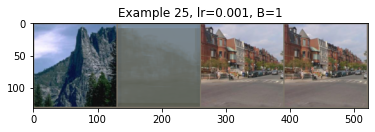

Total loss: 2.47 
Loss on secret: 2.47 
Loss on cover: 0.00


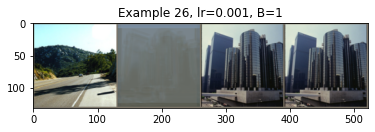

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.39 
Loss on secret: 1.39 
Loss on cover: 0.00


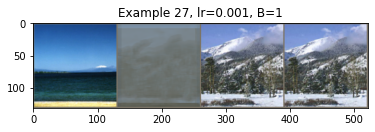

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.44 
Loss on secret: 1.44 
Loss on cover: 0.00


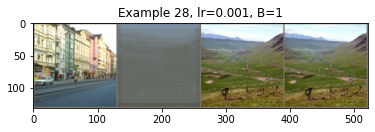

Total loss: 1.41 
Loss on secret: 1.41 
Loss on cover: 0.00


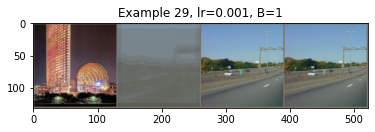

Total loss: 1.01 
Loss on secret: 1.00 
Loss on cover: 0.00


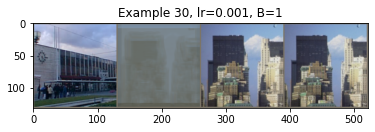

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.72 
Loss on secret: 0.72 
Loss on cover: 0.00


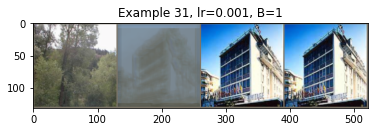

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.82 
Loss on secret: 0.82 
Loss on cover: 0.00


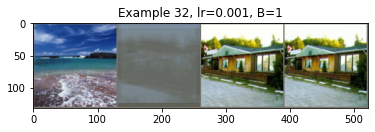

Total loss: 1.52 
Loss on secret: 1.52 
Loss on cover: 0.00


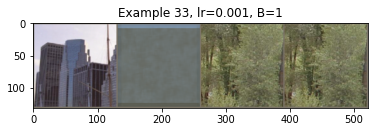

Total loss: 1.40 
Loss on secret: 1.40 
Loss on cover: 0.00


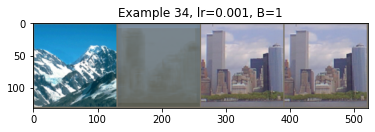

Total loss: 1.27 
Loss on secret: 1.27 
Loss on cover: 0.00


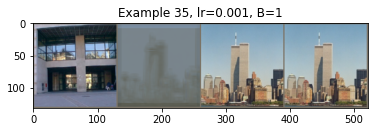

Total loss: 0.77 
Loss on secret: 0.77 
Loss on cover: 0.00


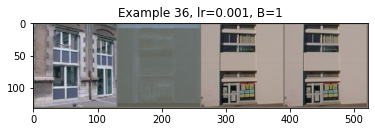

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.23 
Loss on secret: 1.23 
Loss on cover: 0.00


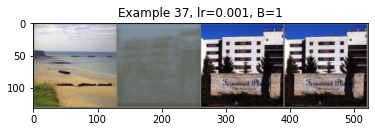

Total loss: 1.17 
Loss on secret: 1.17 
Loss on cover: 0.00


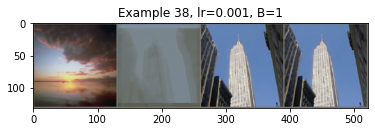

Total loss: 0.87 
Loss on secret: 0.87 
Loss on cover: 0.00


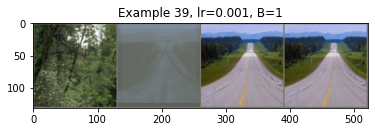

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.95 
Loss on secret: 0.95 
Loss on cover: 0.00


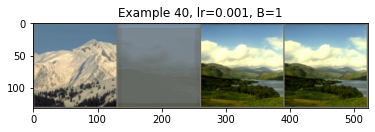

Total loss: 1.70 
Loss on secret: 1.70 
Loss on cover: 0.00


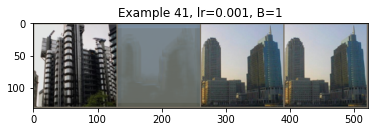

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.44 
Loss on secret: 0.44 
Loss on cover: 0.00


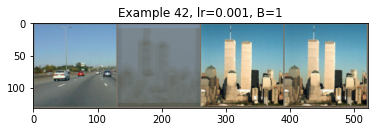

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.23 
Loss on secret: 1.23 
Loss on cover: 0.00


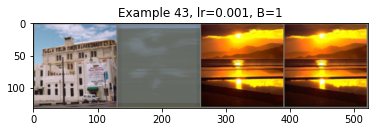

Total loss: 1.07 
Loss on secret: 1.07 
Loss on cover: 0.00


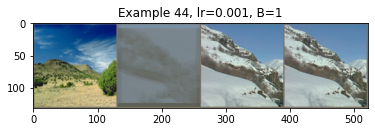

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.66 
Loss on secret: 1.66 
Loss on cover: 0.00


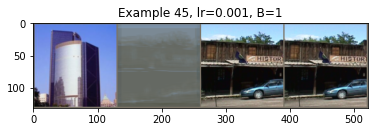

Total loss: 1.62 
Loss on secret: 1.62 
Loss on cover: 0.00


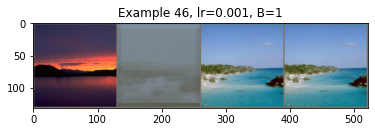

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.61 
Loss on secret: 0.61 
Loss on cover: 0.00


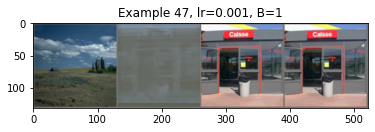

Total loss: 0.89 
Loss on secret: 0.89 
Loss on cover: 0.00


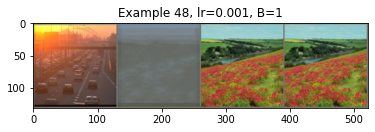

Total loss: 1.75 
Loss on secret: 1.75 
Loss on cover: 0.00


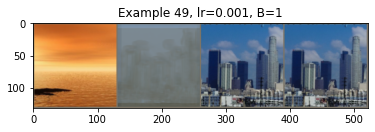

Total loss: 1.68 
Loss on secret: 1.68 
Loss on cover: 0.00


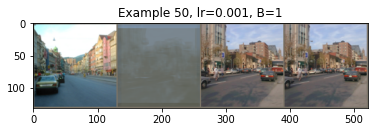

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.18 
Loss on secret: 1.18 
Loss on cover: 0.00


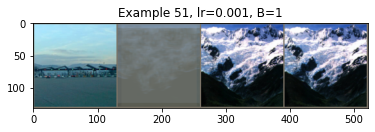

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.61 
Loss on secret: 1.60 
Loss on cover: 0.00


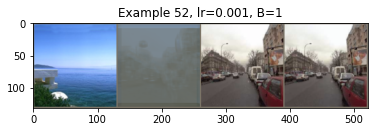

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.99 
Loss on secret: 0.99 
Loss on cover: 0.00


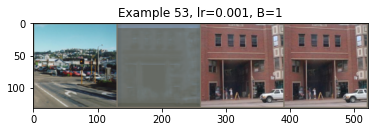

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.03 
Loss on secret: 1.03 
Loss on cover: 0.00


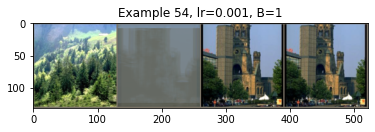

Total loss: 0.78 
Loss on secret: 0.77 
Loss on cover: 0.00


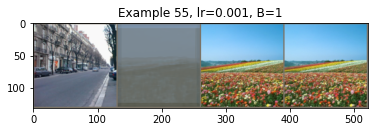

Total loss: 0.46 
Loss on secret: 0.46 
Loss on cover: 0.00


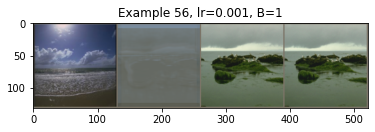

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.16 
Loss on secret: 1.16 
Loss on cover: 0.00


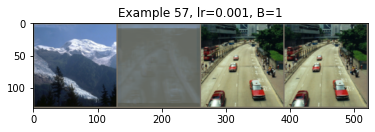

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.48 
Loss on secret: 1.48 
Loss on cover: 0.00


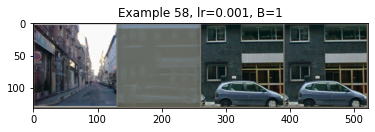

Total loss: 0.98 
Loss on secret: 0.98 
Loss on cover: 0.00


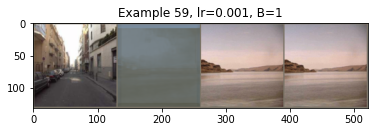

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.89 
Loss on secret: 1.89 
Loss on cover: 0.00


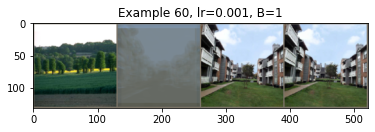

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.62 
Loss on secret: 0.62 
Loss on cover: 0.00


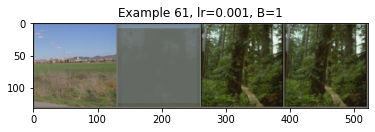

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.77 
Loss on secret: 0.77 
Loss on cover: 0.00


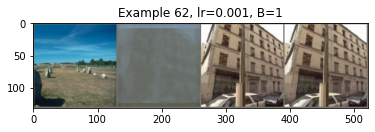

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.17 
Loss on secret: 1.17 
Loss on cover: 0.00


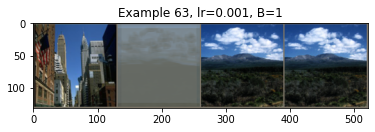

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.93 
Loss on secret: 0.93 
Loss on cover: 0.00


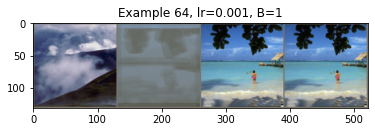

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.41 
Loss on secret: 0.41 
Loss on cover: 0.00


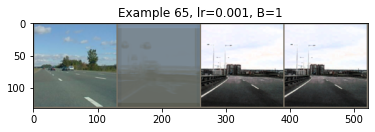

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.23 
Loss on secret: 1.23 
Loss on cover: 0.00


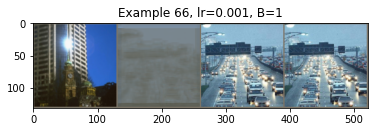

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.26 
Loss on secret: 1.26 
Loss on cover: 0.00


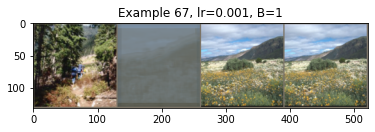

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.09 
Loss on secret: 2.09 
Loss on cover: 0.00


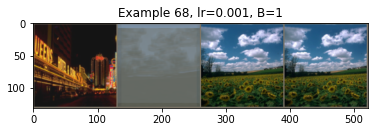

Total loss: 1.13 
Loss on secret: 1.13 
Loss on cover: 0.00


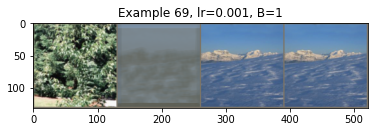

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.60 
Loss on secret: 0.60 
Loss on cover: 0.00


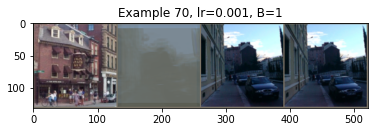

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.96 
Loss on secret: 0.96 
Loss on cover: 0.00


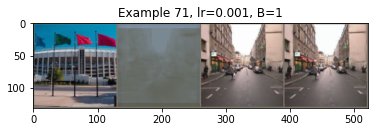

Total loss: 1.32 
Loss on secret: 1.32 
Loss on cover: 0.00


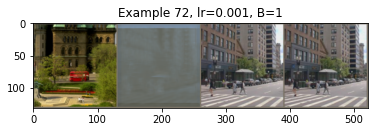

Total loss: 0.56 
Loss on secret: 0.56 
Loss on cover: 0.00


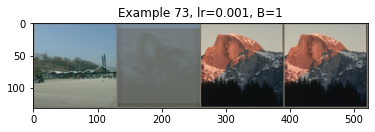

Total loss: 0.79 
Loss on secret: 0.79 
Loss on cover: 0.00


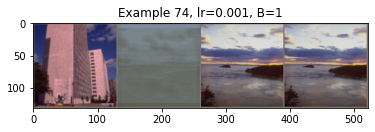

Total loss: 1.67 
Loss on secret: 1.67 
Loss on cover: 0.00


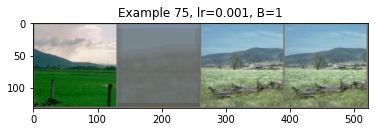

Total loss: 1.44 
Loss on secret: 1.44 
Loss on cover: 0.00


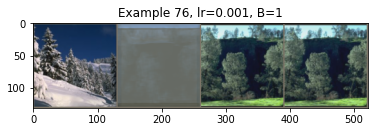

Total loss: 1.42 
Loss on secret: 1.42 
Loss on cover: 0.00


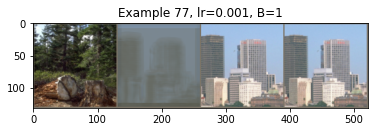

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.52 
Loss on secret: 1.52 
Loss on cover: 0.00


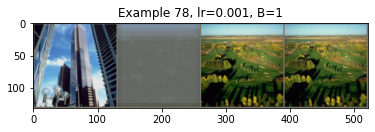

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.55 
Loss on secret: 0.55 
Loss on cover: 0.00


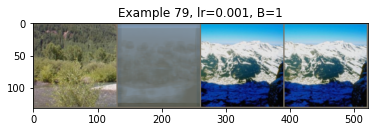

Total loss: 0.96 
Loss on secret: 0.96 
Loss on cover: 0.00


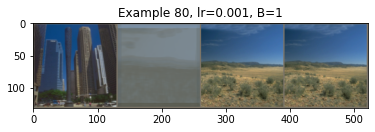

Total loss: 0.91 
Loss on secret: 0.91 
Loss on cover: 0.00


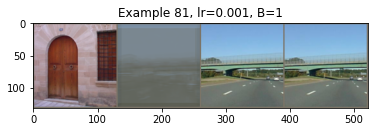

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.18 
Loss on secret: 1.18 
Loss on cover: 0.00


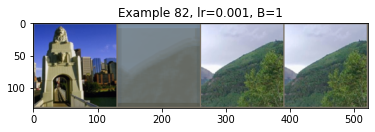

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.55 
Loss on secret: 0.55 
Loss on cover: 0.00


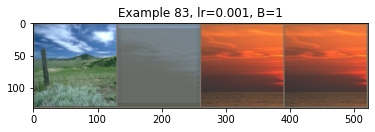

Total loss: 1.00 
Loss on secret: 1.00 
Loss on cover: 0.00


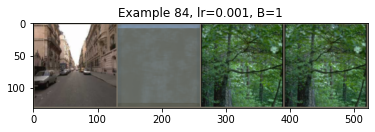

Total loss: 1.69 
Loss on secret: 1.69 
Loss on cover: 0.00


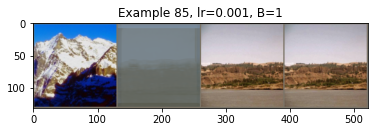

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.46 
Loss on secret: 0.46 
Loss on cover: 0.00


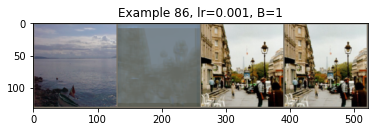

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.72 
Loss on secret: 0.72 
Loss on cover: 0.00


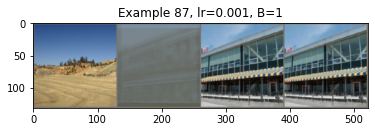

Total loss: 0.47 
Loss on secret: 0.47 
Loss on cover: 0.00


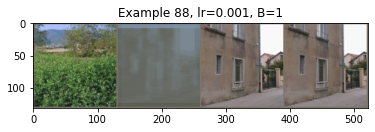

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.48 
Loss on secret: 0.48 
Loss on cover: 0.00


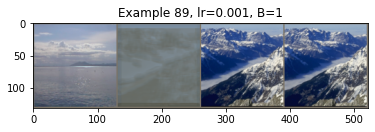

Total loss: 0.87 
Loss on secret: 0.87 
Loss on cover: 0.00


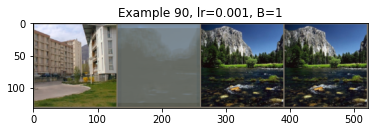

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.40 
Loss on secret: 0.40 
Loss on cover: 0.00


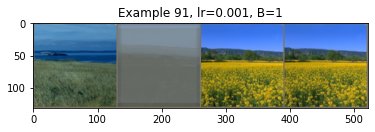

Total loss: 0.72 
Loss on secret: 0.71 
Loss on cover: 0.00


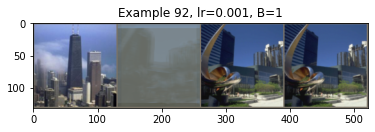

Total loss: 1.40 
Loss on secret: 1.40 
Loss on cover: 0.00


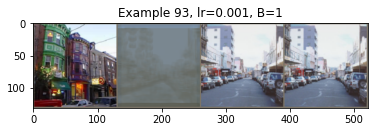

Total loss: 1.41 
Loss on secret: 1.41 
Loss on cover: 0.00


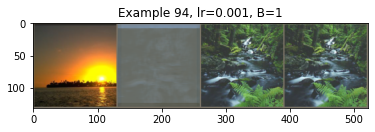

Total loss: 1.14 
Loss on secret: 1.14 
Loss on cover: 0.00


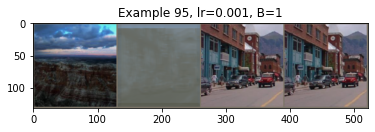

Total loss: 0.37 
Loss on secret: 0.37 
Loss on cover: 0.00


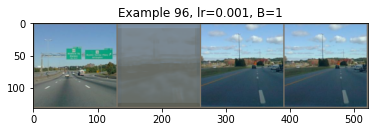

Total loss: 1.29 
Loss on secret: 1.29 
Loss on cover: 0.00


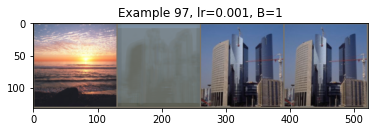

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.21 
Loss on secret: 2.21 
Loss on cover: 0.00


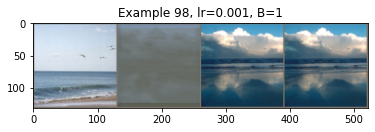

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.44 
Loss on secret: 0.44 
Loss on cover: 0.00


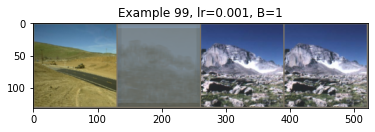

Total loss: 1.49 
Loss on secret: 1.49 
Loss on cover: 0.00


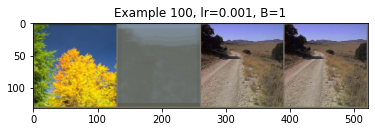

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.68 
Loss on secret: 0.68 
Loss on cover: 0.00


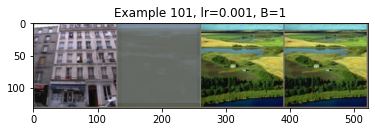

Total loss: 1.30 
Loss on secret: 1.30 
Loss on cover: 0.00


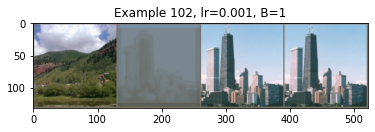

Total loss: 1.02 
Loss on secret: 1.02 
Loss on cover: 0.00


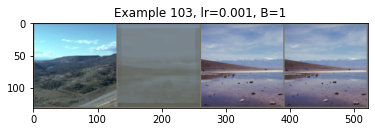

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.88 
Loss on secret: 0.88 
Loss on cover: 0.00


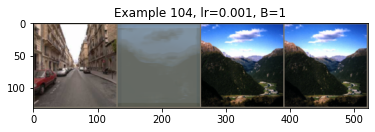

Total loss: 0.77 
Loss on secret: 0.77 
Loss on cover: 0.00


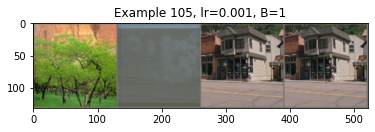

Total loss: 1.42 
Loss on secret: 1.42 
Loss on cover: 0.00


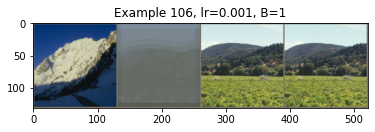

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.35 
Loss on secret: 1.35 
Loss on cover: 0.00


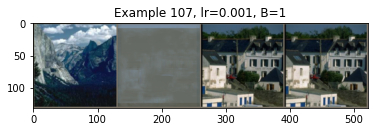

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.89 
Loss on secret: 0.89 
Loss on cover: 0.00


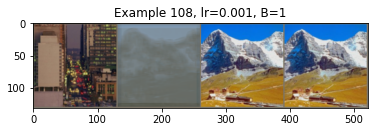

Total loss: 1.06 
Loss on secret: 1.06 
Loss on cover: 0.00


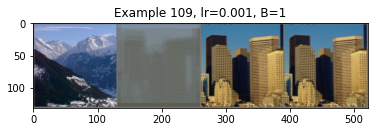

Total loss: 1.62 
Loss on secret: 1.62 
Loss on cover: 0.00


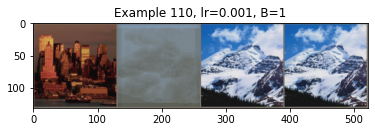

Total loss: 2.00 
Loss on secret: 2.00 
Loss on cover: 0.00


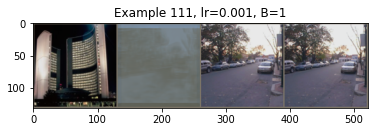

Total loss: 2.88 
Loss on secret: 2.88 
Loss on cover: 0.00


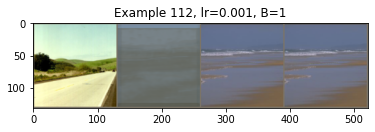

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.65 
Loss on secret: 0.65 
Loss on cover: 0.00


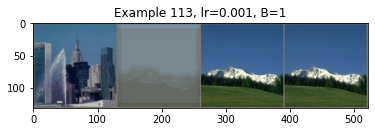

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.74 
Loss on secret: 0.74 
Loss on cover: 0.00


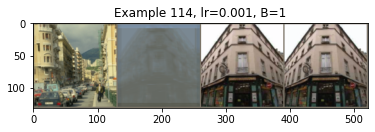

Total loss: 1.22 
Loss on secret: 1.22 
Loss on cover: 0.00


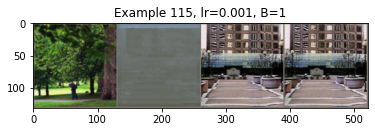

Total loss: 0.73 
Loss on secret: 0.73 
Loss on cover: 0.00


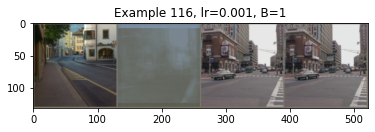

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.80 
Loss on secret: 1.80 
Loss on cover: 0.00


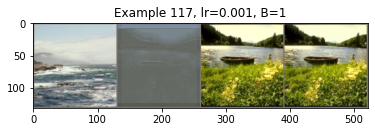

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.06 
Loss on secret: 1.06 
Loss on cover: 0.00


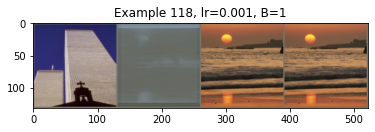

Total loss: 1.25 
Loss on secret: 1.25 
Loss on cover: 0.00


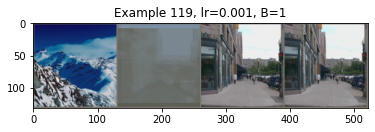

Total loss: 1.24 
Loss on secret: 1.24 
Loss on cover: 0.00


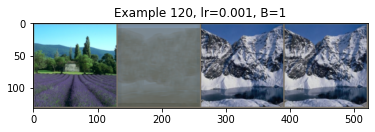

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.92 
Loss on secret: 0.92 
Loss on cover: 0.00


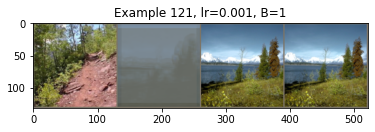

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.24 
Loss on secret: 1.23 
Loss on cover: 0.00


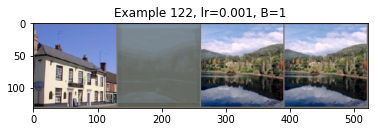

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.21 
Loss on secret: 1.21 
Loss on cover: 0.00


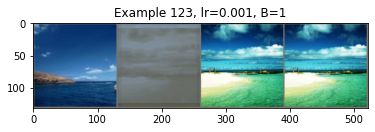

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.91 
Loss on secret: 1.91 
Loss on cover: 0.00


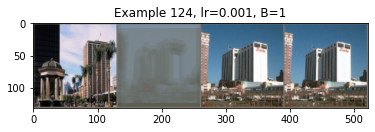

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.82 
Loss on secret: 0.82 
Loss on cover: 0.00


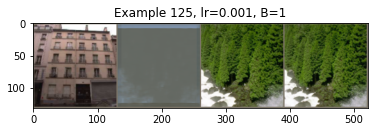

Total loss: 0.42 
Loss on secret: 0.42 
Loss on cover: 0.00


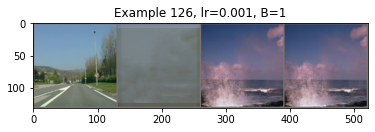

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.68 
Loss on secret: 0.68 
Loss on cover: 0.00


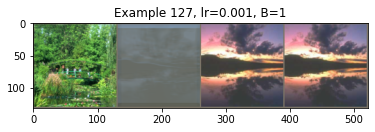

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.75 
Loss on secret: 0.75 
Loss on cover: 0.00


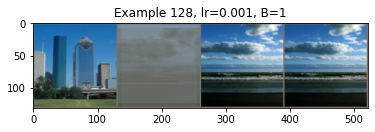

Total loss: 1.37 
Loss on secret: 1.37 
Loss on cover: 0.00


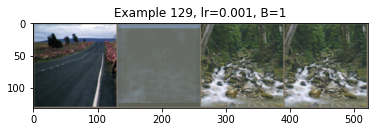

Total loss: 0.63 
Loss on secret: 0.63 
Loss on cover: 0.00


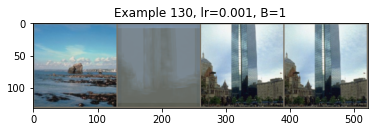

Total loss: 0.66 
Loss on secret: 0.66 
Loss on cover: 0.00


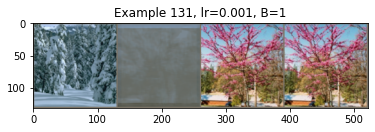

Total loss: 1.57 
Loss on secret: 1.57 
Loss on cover: 0.00


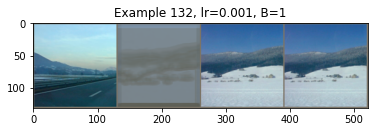

Total loss: 0.64 
Loss on secret: 0.64 
Loss on cover: 0.00


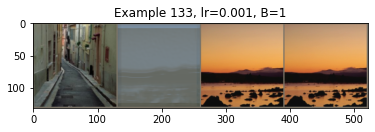

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.88 
Loss on secret: 0.88 
Loss on cover: 0.00


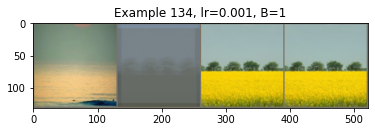

Total loss: 1.75 
Loss on secret: 1.75 
Loss on cover: 0.00


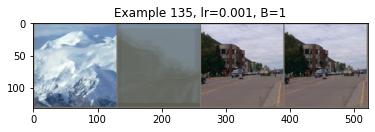

Total loss: 1.29 
Loss on secret: 1.29 
Loss on cover: 0.00


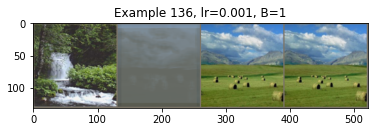

Total loss: 1.01 
Loss on secret: 1.01 
Loss on cover: 0.00


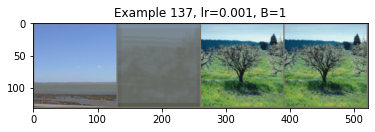

Total loss: 1.18 
Loss on secret: 1.18 
Loss on cover: 0.00


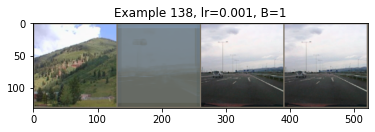

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.22 
Loss on secret: 1.22 
Loss on cover: 0.00


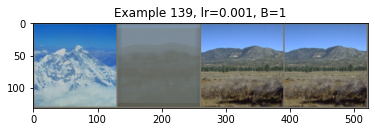

Total loss: 1.60 
Loss on secret: 1.60 
Loss on cover: 0.00


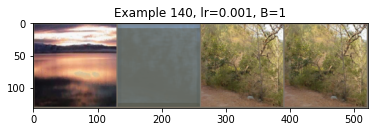

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.28 
Loss on secret: 2.28 
Loss on cover: 0.00


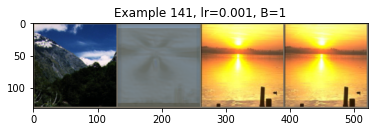

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.48 
Loss on secret: 1.48 
Loss on cover: 0.00


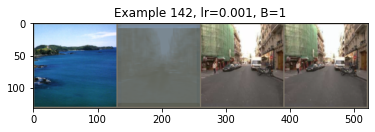

Total loss: 1.38 
Loss on secret: 1.38 
Loss on cover: 0.00


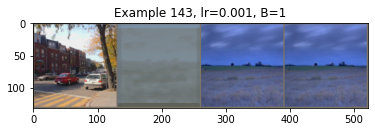

Total loss: 1.25 
Loss on secret: 1.25 
Loss on cover: 0.00


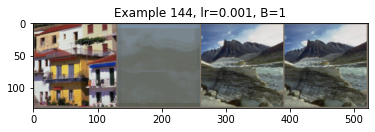

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.34 
Loss on secret: 1.33 
Loss on cover: 0.00


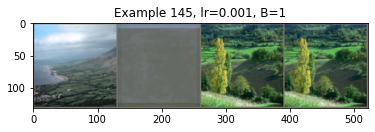

Total loss: 0.96 
Loss on secret: 0.96 
Loss on cover: 0.00


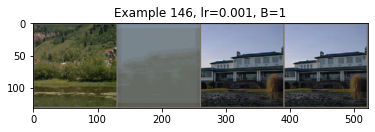

Total loss: 1.23 
Loss on secret: 1.23 
Loss on cover: 0.00


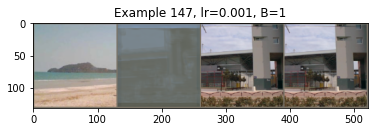

Total loss: 1.70 
Loss on secret: 1.70 
Loss on cover: 0.00


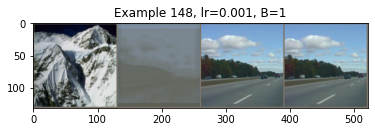

Total loss: 1.09 
Loss on secret: 1.09 
Loss on cover: 0.00


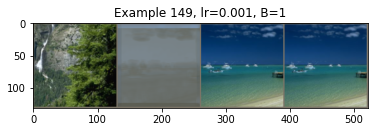

Total loss: 2.39 
Loss on secret: 2.39 
Loss on cover: 0.00


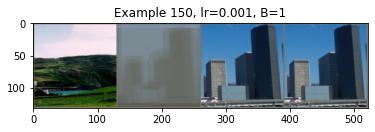

Total loss: 1.48 
Loss on secret: 1.48 
Loss on cover: 0.00


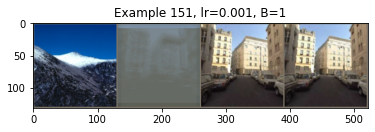

Total loss: 0.93 
Loss on secret: 0.93 
Loss on cover: 0.00


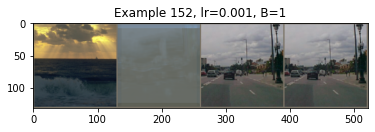

Total loss: 0.78 
Loss on secret: 0.78 
Loss on cover: 0.00


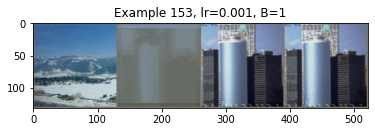

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.32 
Loss on secret: 2.32 
Loss on cover: 0.00


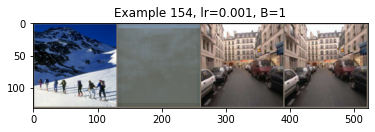

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.48 
Loss on secret: 0.48 
Loss on cover: 0.00


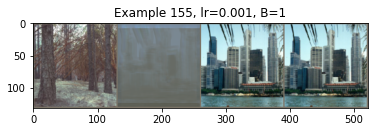

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.31 
Loss on secret: 1.31 
Loss on cover: 0.00


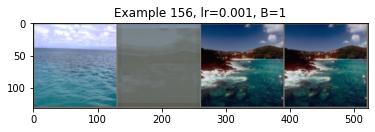

Total loss: 0.92 
Loss on secret: 0.92 
Loss on cover: 0.00


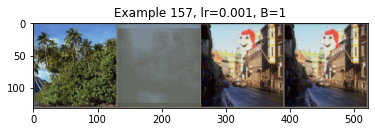

Total loss: 1.48 
Loss on secret: 1.48 
Loss on cover: 0.00


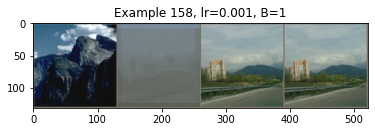

Total loss: 1.82 
Loss on secret: 1.82 
Loss on cover: 0.00


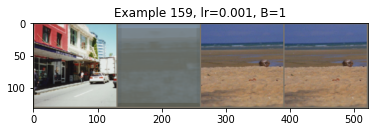

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.73 
Loss on secret: 0.73 
Loss on cover: 0.00


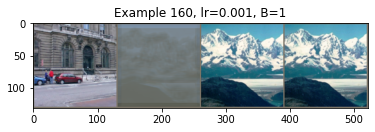

Total loss: 0.65 
Loss on secret: 0.65 
Loss on cover: 0.00


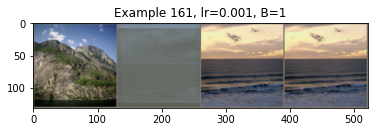

Total loss: 1.10 
Loss on secret: 1.10 
Loss on cover: 0.00


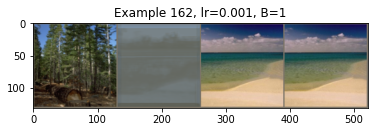

Total loss: 1.75 
Loss on secret: 1.75 
Loss on cover: 0.00


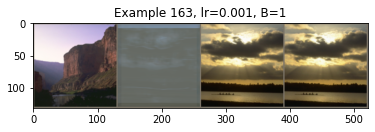

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.09 
Loss on secret: 2.08 
Loss on cover: 0.00


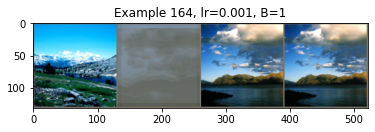

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.99 
Loss on secret: 0.99 
Loss on cover: 0.00


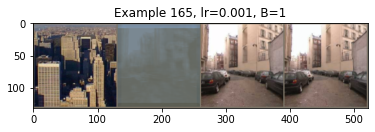

Total loss: 2.09 
Loss on secret: 2.09 
Loss on cover: 0.00


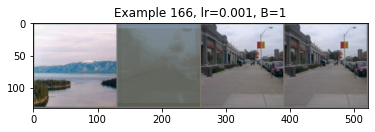

Total loss: 0.39 
Loss on secret: 0.39 
Loss on cover: 0.00


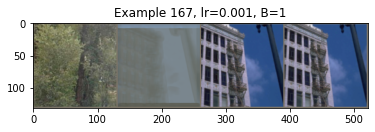

Total loss: 1.74 
Loss on secret: 1.74 
Loss on cover: 0.00


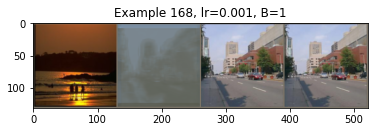

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.16 
Loss on secret: 1.16 
Loss on cover: 0.00


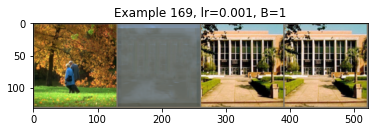

Total loss: 1.79 
Loss on secret: 1.79 
Loss on cover: 0.00


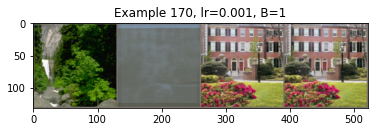

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.50 
Loss on secret: 1.50 
Loss on cover: 0.00


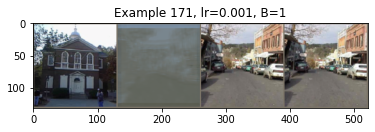

Total loss: 1.38 
Loss on secret: 1.38 
Loss on cover: 0.00


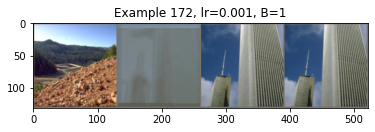

Total loss: 0.75 
Loss on secret: 0.75 
Loss on cover: 0.00


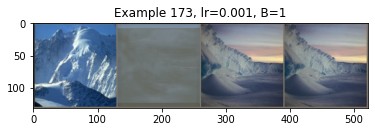

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.61 
Loss on secret: 0.61 
Loss on cover: 0.00


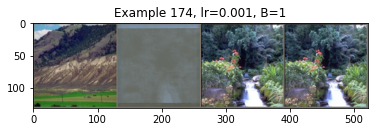

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.94 
Loss on secret: 0.94 
Loss on cover: 0.00


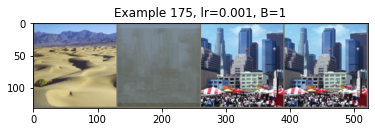

Total loss: 1.52 
Loss on secret: 1.52 
Loss on cover: 0.00


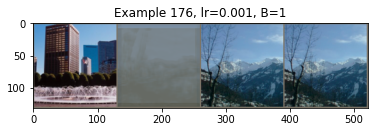

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.26 
Loss on secret: 1.26 
Loss on cover: 0.00


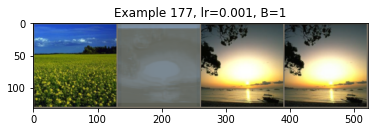

Total loss: 0.66 
Loss on secret: 0.66 
Loss on cover: 0.00


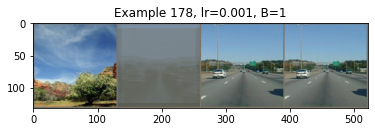

Total loss: 1.08 
Loss on secret: 1.08 
Loss on cover: 0.00


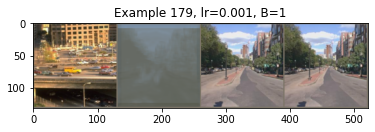

Total loss: 1.12 
Loss on secret: 1.12 
Loss on cover: 0.00


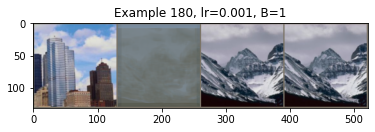

Total loss: 1.27 
Loss on secret: 1.27 
Loss on cover: 0.00


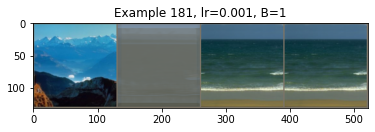

Total loss: 0.46 
Loss on secret: 0.46 
Loss on cover: 0.00


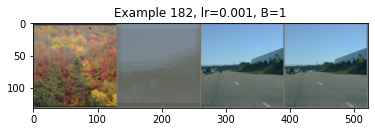

Total loss: 0.77 
Loss on secret: 0.77 
Loss on cover: 0.00


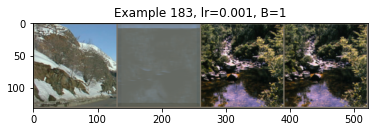

Total loss: 0.47 
Loss on secret: 0.47 
Loss on cover: 0.00


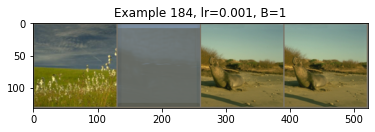

Total loss: 1.15 
Loss on secret: 1.15 
Loss on cover: 0.00


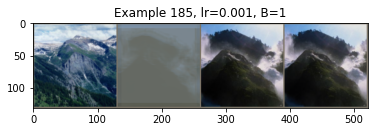

Total loss: 1.91 
Loss on secret: 1.91 
Loss on cover: 0.00


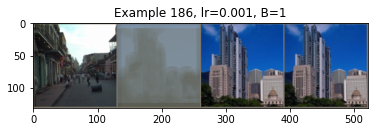

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.24 
Loss on secret: 1.24 
Loss on cover: 0.00


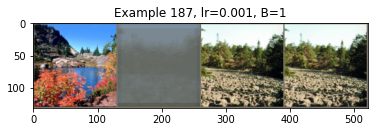

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.07 
Loss on secret: 1.07 
Loss on cover: 0.00


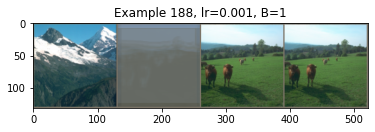

Total loss: 0.72 
Loss on secret: 0.72 
Loss on cover: 0.00


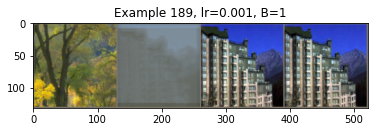

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.25 
Loss on secret: 1.25 
Loss on cover: 0.00


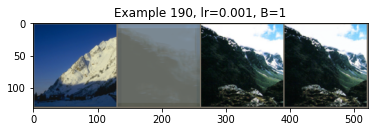

Total loss: 1.63 
Loss on secret: 1.63 
Loss on cover: 0.00


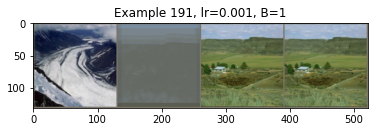

Total loss: 1.31 
Loss on secret: 1.31 
Loss on cover: 0.00


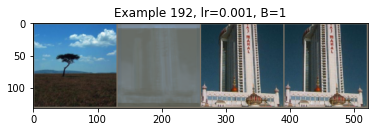

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.75 
Loss on secret: 0.75 
Loss on cover: 0.00


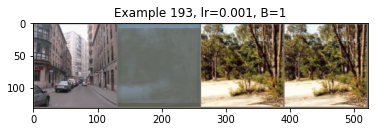

Total loss: 0.32 
Loss on secret: 0.32 
Loss on cover: 0.00


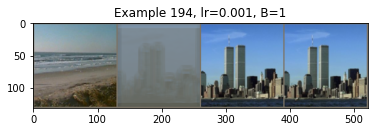

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 2.87 
Loss on secret: 2.87 
Loss on cover: 0.00


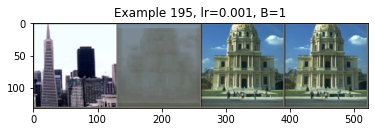

Total loss: 0.81 
Loss on secret: 0.81 
Loss on cover: 0.00


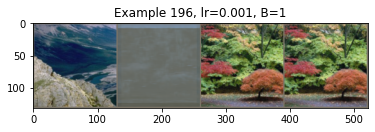

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.27 
Loss on secret: 0.27 
Loss on cover: 0.00


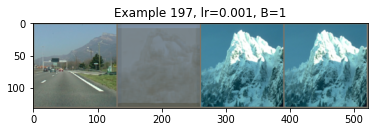

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.99 
Loss on secret: 0.99 
Loss on cover: 0.00


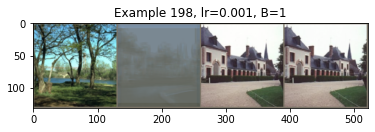

Total loss: 1.30 
Loss on secret: 1.30 
Loss on cover: 0.00


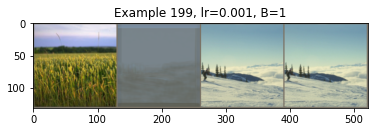

Total loss: 1.08 
Loss on secret: 1.08 
Loss on cover: 0.00


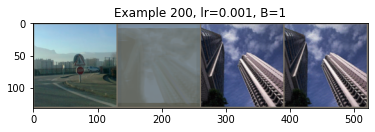

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.26 
Loss on secret: 1.26 
Loss on cover: 0.00


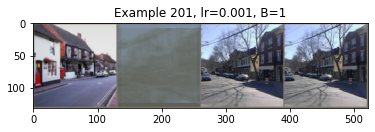

Total loss: 1.73 
Loss on secret: 1.73 
Loss on cover: 0.00


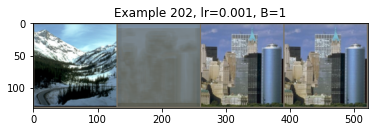

Total loss: 0.76 
Loss on secret: 0.76 
Loss on cover: 0.00


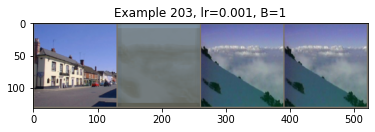

Total loss: 1.61 
Loss on secret: 1.61 
Loss on cover: 0.00


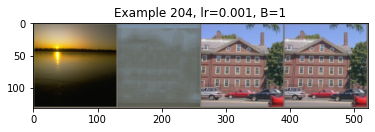

Total loss: 1.48 
Loss on secret: 1.48 
Loss on cover: 0.00


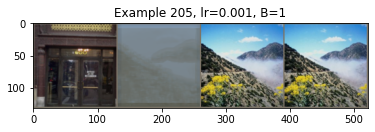

Total loss: 1.48 
Loss on secret: 1.48 
Loss on cover: 0.00


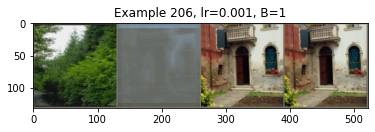

Total loss: 1.03 
Loss on secret: 1.03 
Loss on cover: 0.00


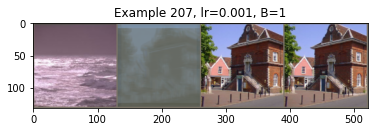

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.91 
Loss on secret: 0.91 
Loss on cover: 0.00


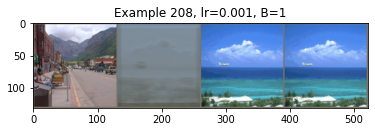

Total loss: 0.85 
Loss on secret: 0.85 
Loss on cover: 0.00


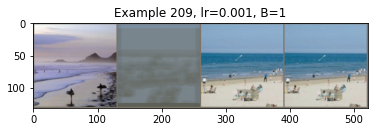

Total loss: 1.21 
Loss on secret: 1.21 
Loss on cover: 0.00


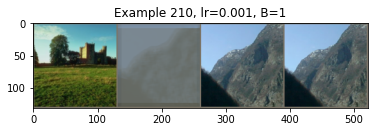

Total loss: 1.04 
Loss on secret: 1.04 
Loss on cover: 0.00


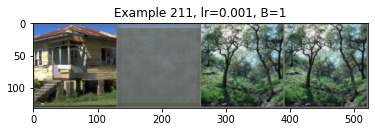

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.43 
Loss on secret: 1.43 
Loss on cover: 0.00


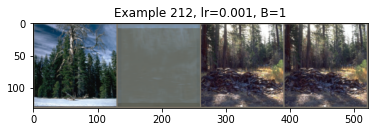

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.24 
Loss on secret: 1.23 
Loss on cover: 0.00


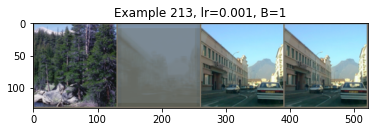

Total loss: 0.87 
Loss on secret: 0.87 
Loss on cover: 0.00


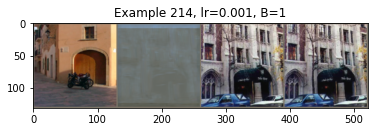

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.66 
Loss on secret: 0.66 
Loss on cover: 0.00


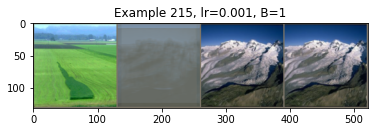

Total loss: 1.83 
Loss on secret: 1.83 
Loss on cover: 0.00


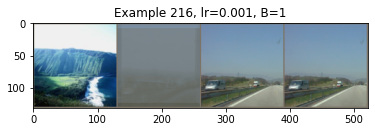

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.12 
Loss on secret: 1.12 
Loss on cover: 0.00


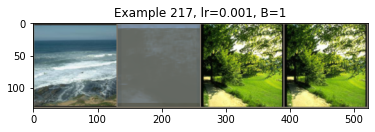

Total loss: 2.19 
Loss on secret: 2.19 
Loss on cover: 0.00


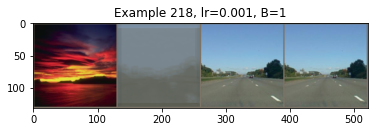

Total loss: 2.76 
Loss on secret: 2.76 
Loss on cover: 0.00


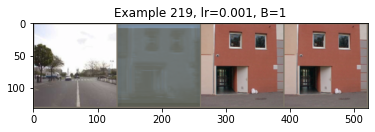

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.61 
Loss on secret: 0.61 
Loss on cover: 0.00


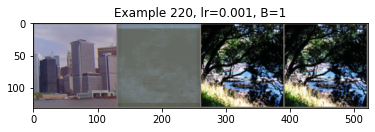

Total loss: 0.68 
Loss on secret: 0.68 
Loss on cover: 0.00


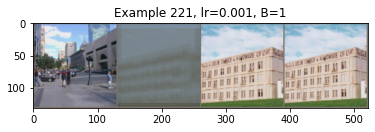

Total loss: 0.45 
Loss on secret: 0.45 
Loss on cover: 0.00


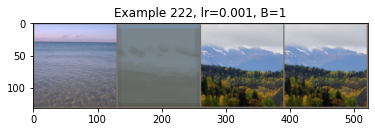

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.72 
Loss on secret: 0.71 
Loss on cover: 0.00


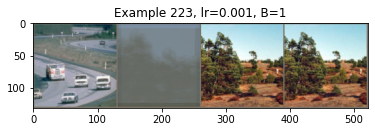

Total loss: 1.15 
Loss on secret: 1.15 
Loss on cover: 0.00


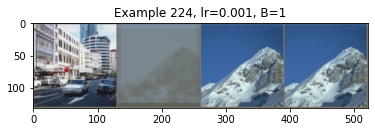

Total loss: 0.77 
Loss on secret: 0.77 
Loss on cover: 0.00


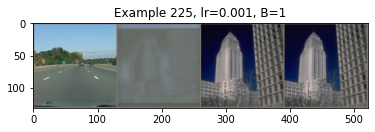

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.97 
Loss on secret: 0.97 
Loss on cover: 0.00


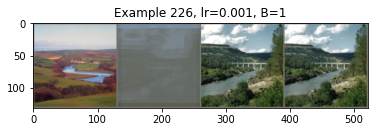

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.57 
Loss on secret: 0.57 
Loss on cover: 0.00


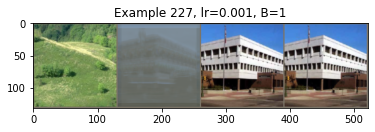

Total loss: 1.69 
Loss on secret: 1.69 
Loss on cover: 0.00


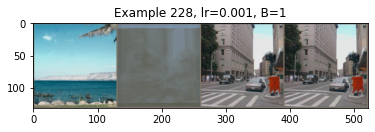

Total loss: 0.78 
Loss on secret: 0.78 
Loss on cover: 0.00


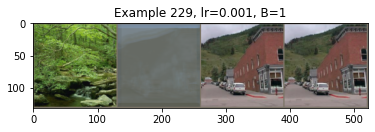

Total loss: 1.10 
Loss on secret: 1.10 
Loss on cover: 0.00


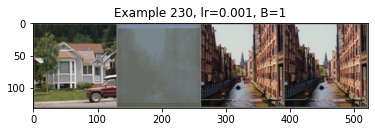

Total loss: 0.94 
Loss on secret: 0.94 
Loss on cover: 0.00


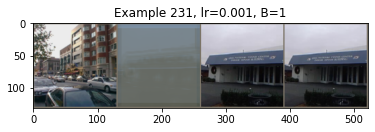

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.98 
Loss on secret: 0.98 
Loss on cover: 0.00


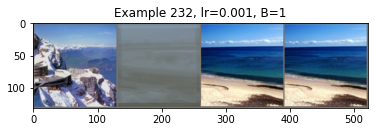

Total loss: 1.20 
Loss on secret: 1.20 
Loss on cover: 0.00


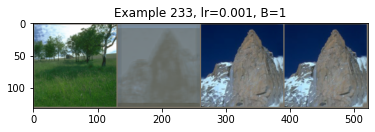

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.11 
Loss on secret: 1.11 
Loss on cover: 0.00


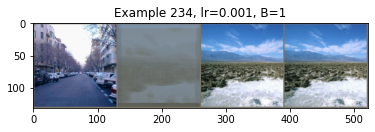

Total loss: 2.14 
Loss on secret: 2.14 
Loss on cover: 0.00


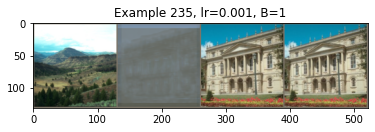

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.46 
Loss on secret: 0.46 
Loss on cover: 0.00


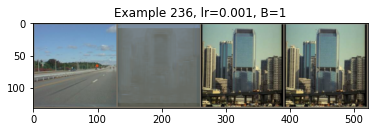

Total loss: 0.68 
Loss on secret: 0.68 
Loss on cover: 0.00


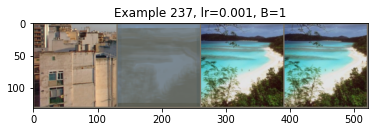

Total loss: 1.40 
Loss on secret: 1.40 
Loss on cover: 0.00


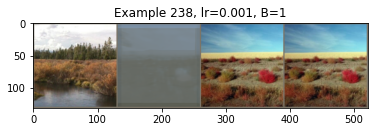

Total loss: 0.79 
Loss on secret: 0.79 
Loss on cover: 0.00


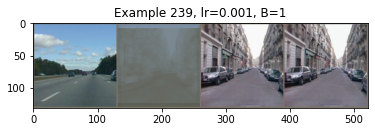

Total loss: 1.33 
Loss on secret: 1.33 
Loss on cover: 0.00


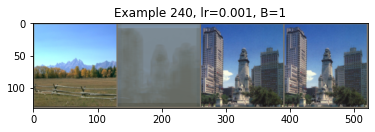

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.06 
Loss on secret: 1.06 
Loss on cover: 0.00


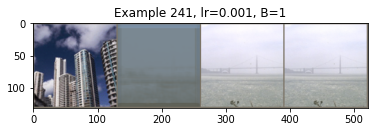

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.63 
Loss on secret: 0.63 
Loss on cover: 0.00


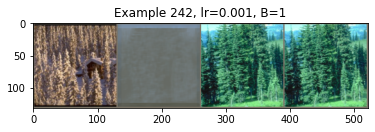

Total loss: 0.49 
Loss on secret: 0.49 
Loss on cover: 0.00


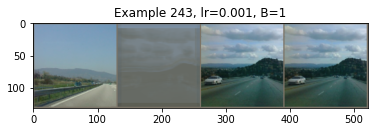

Total loss: 0.62 
Loss on secret: 0.62 
Loss on cover: 0.00


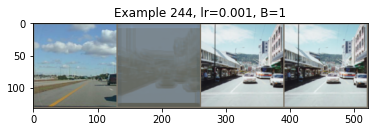

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.48 
Loss on secret: 0.48 
Loss on cover: 0.00


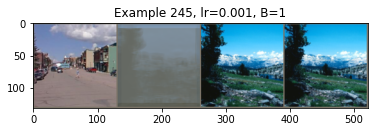

Total loss: 0.46 
Loss on secret: 0.46 
Loss on cover: 0.00


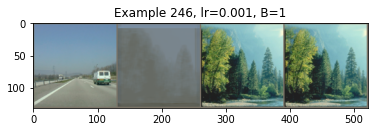

Total loss: 0.84 
Loss on secret: 0.84 
Loss on cover: 0.00


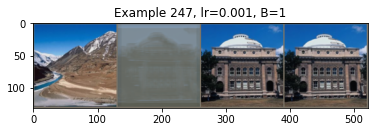

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.57 
Loss on secret: 0.57 
Loss on cover: 0.00


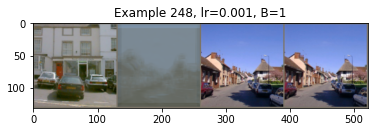

Total loss: 0.89 
Loss on secret: 0.89 
Loss on cover: 0.00


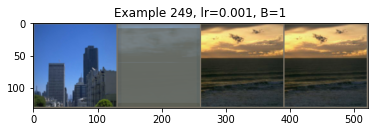

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.25 
Loss on secret: 1.25 
Loss on cover: 0.00


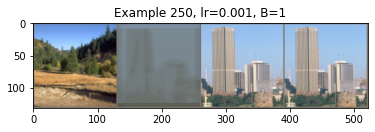

Total loss: 0.89 
Loss on secret: 0.89 
Loss on cover: 0.00


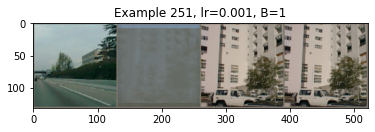

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.59 
Loss on secret: 1.59 
Loss on cover: 0.00


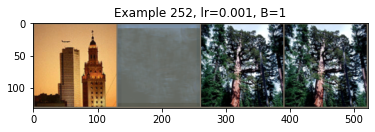

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.92 
Loss on secret: 1.92 
Loss on cover: 0.00


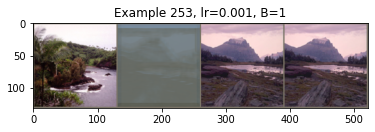

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.28 
Loss on secret: 0.28 
Loss on cover: 0.00


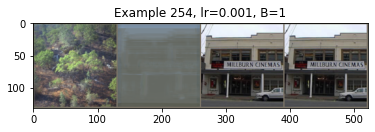

Total loss: 1.17 
Loss on secret: 1.17 
Loss on cover: 0.00


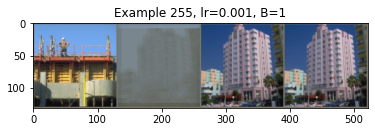

Total loss: 0.73 
Loss on secret: 0.73 
Loss on cover: 0.00


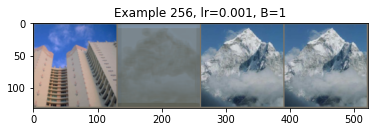

Total loss: 1.49 
Loss on secret: 1.49 
Loss on cover: 0.00


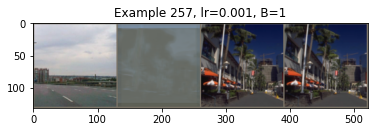

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.76 
Loss on secret: 0.76 
Loss on cover: 0.00


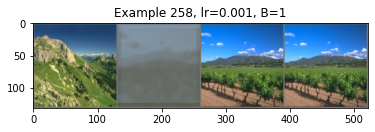

Total loss: 1.56 
Loss on secret: 1.56 
Loss on cover: 0.00


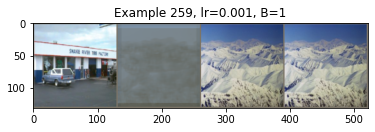

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.60 
Loss on secret: 0.60 
Loss on cover: 0.00


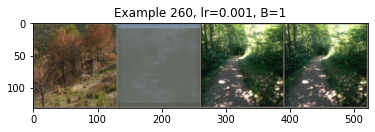

Total loss: 0.70 
Loss on secret: 0.70 
Loss on cover: 0.00


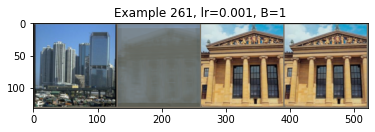

Total loss: 1.15 
Loss on secret: 1.15 
Loss on cover: 0.00


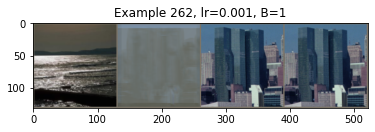

Total loss: 1.43 
Loss on secret: 1.43 
Loss on cover: 0.00


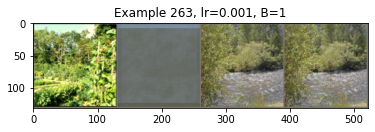

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.19 
Loss on secret: 1.19 
Loss on cover: 0.00


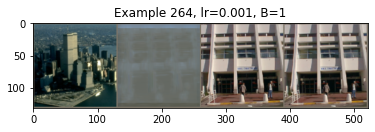

Total loss: 0.74 
Loss on secret: 0.74 
Loss on cover: 0.00


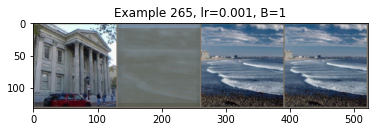

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.85 
Loss on secret: 1.85 
Loss on cover: 0.00


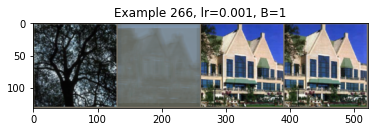

Total loss: 1.38 
Loss on secret: 1.38 
Loss on cover: 0.00


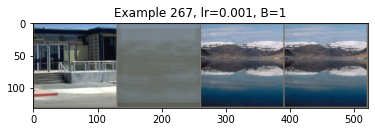

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.12 
Loss on secret: 1.12 
Loss on cover: 0.00


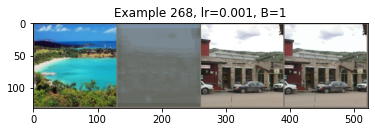

Total loss: 0.93 
Loss on secret: 0.93 
Loss on cover: 0.00


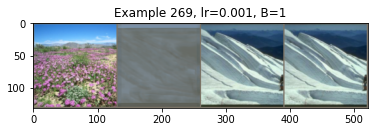

Average loss on test set: 1.15


In [23]:
# Switch to evaluate mode
model.eval()

test_losses = []
# Show images
for idx, test_batch in enumerate(test_loader):
     # Saves images
    data = test_batch.cuda()
    # Saves secret images and secret covers
    test_secret = data[:len(data)//2]
    test_cover = data[len(data)//2:]

    # Creates variable from secret and cover images

    test_secret = test_secret.clone().detach().requires_grad_(False)
    test_cover = test_cover.clone().detach().requires_grad_(False)
    # Compute output
    test_hidden, test_output = model(test_secret, test_cover)
    
    # Calculate loss
    test_loss, loss_cover, loss_secret = customized_loss(test_output, test_hidden, test_secret, test_cover, beta)
    
    test_secret = torch.tensor(test_secret).to('cpu')
    test_cover = torch.tensor(test_cover).to('cpu')
    test_hidden, test_output = test_hidden.cpu(), test_output.cpu() 
    
#     diff_S, diff_C = np.abs(np.array(test_output.data[0]) - np.array(test_secret.data[0])), np.abs(np.array(test_hidden.data[0]) - np.array(test_cover.data[0]))
    
#     print (diff_S, diff_C)
#     test_secret.data, test_output.data, test_cover.data, test_hidden.data,test_output.data = 
    if idx < 500:
        print ('Total loss: {:.2f} \nLoss on secret: {:.2f} \nLoss on cover: {:.2f}'.format(torch.Tensor.item(test_loss.data), torch.Tensor.item(loss_secret.data), torch.Tensor.item(loss_cover.data)))

        # Creates img tensor
        imgs = [test_secret.data, test_output.data, test_cover.data, test_hidden.data,]
        imgs_tsor = torch.cat(imgs, 0)

        # Prints Images
        imshow(utils.make_grid(imgs_tsor), idx+1, learning_rate=learning_rate, beta=beta)
        
    test_losses.append(torch.Tensor.item(test_loss.data))
        
mean_test_loss = np.mean(test_losses)

print ('Average loss on test set: {:.2f}'.format(mean_test_loss))